In [1]:
import sys

# Add parent directory to path for imports
sys.path.insert(0, "/home/hgf_hmgu/hgf_gib4562/tdmpc2/")

import matplotlib.pyplot as plt
import numpy as np
import pickle
from tqdm import tqdm
import pandas as pd
import json
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Compute cosine similarity matrix between all gradient results
import torch.nn.functional as F

In [2]:
from analysis.utils import load_sweep_metadata, load_data

In [3]:
import seaborn as sns
from scipy.cluster.hierarchy import linkage, leaves_list
import matplotlib.pyplot as plt
import numpy as np


def correlation_matrix(z, optimal_ordering=False):
    sim = np.corrcoef(z.T)

    # Perform hierarchical clustering for stable
    link = linkage(sim, optimal_ordering=optimal_ordering)
    order = leaves_list(link)
    sim_reordered = sim[order][:, order]

    return sim, sim_reordered

In [4]:
def compute_success(df_data,
                    threshold_angle=0.1,
                    consecutive_steps=100,
                    starting_step=0,
                    column_name=None):
    """
    Compute whether the pole is upright (straight) for consecutive_steps time points.
    
    Args:
        df_data: DataFrame with 'observations' column containing state arrays
        threshold_angle: Maximum angle deviation from vertical (in radians) to consider "straight"
        consecutive_steps: Number of consecutive steps required for success
    
    Returns:
        df_data: DataFrame with added 'success' column
    """
    success = []

    for idx in range(len(df_data)):
        observations = np.array(df_data['observations'].iloc[idx])
        observations = observations[starting_step:]

        # Extract cos and sin of pole angle (dimensions 1 and 2)
        cos_angle = observations[:, 1]
        sin_angle = observations[:, 2]

        # Compute actual angle from cos and sin
        angles = np.arctan2(sin_angle, cos_angle)

        # Check if angle is within threshold (close to 0, which is upright)
        is_straight = np.abs(angles) < threshold_angle

        # Check for consecutive_steps consecutive True values
        episode_success = False
        count = 0
        for straight in is_straight:
            if straight:
                count += 1
                if count >= consecutive_steps:
                    episode_success = True
                    break
            else:
                count = 0

        success.append(episode_success)
    column_name = column_name if column_name is not None else 'success'
    df_data[column_name] = np.array(success)
    return df_data

In [5]:
df_metadata = load_sweep_metadata(
    ["logs/25-12-09-cartpole_initial_conditions_seeds_models"],
    json_file_name='episode_metadata.json')


Dirs in logs/25-12-09-cartpole_initial_conditions_seeds_models: 100%|██████████| 825/825 [00:00<00:00, 12929.28it/s]

Found 825 configurations


In [6]:
df_metadata = df_metadata[df_metadata['checkpoint'] ==
                          'ckpts/cartpole-swingup-3.pt']

In [7]:
df = load_data(df_metadata, episode_file_name='episode_data.pkl')
df = compute_success(df, starting_step=300, consecutive_steps=200)

Found 275 configurations


  0%|          | 0/275 [00:00<?, ?it/s]

100%|██████████| 275/275 [00:00<00:00, 336.33it/s]


In [8]:
df_success = df[df['success']]

In [9]:
df.shape, df_success.shape

((275, 18), (257, 18))

In [10]:
dim_names = {
    0: 'Cart Position',
    1: 'cos(Pole Angle)',
    2: 'sin(Pole Angle)',
    3: 'Cart Velocity',
    4: 'Pole Angular Velocity',
}

In [11]:
df['init_cart_position'] = df['initial_state'].apply(lambda x: x[0])
df['init_pole_angle'] = df['initial_state'].apply(lambda x: x[1])
df['init_pole_angle_degrees'] = np.degrees(df['init_pole_angle'])
df['init_pole_angle_str'] = df['init_pole_angle_degrees'].round(0).astype(str)

for dim in range(5):
    df[f'average_dim_{dim}'] = df['observations'].apply(
        lambda x: np.mean(np.array(x)[:, dim]))

df['total_position_change'] = df['observations'].apply(
    lambda x: np.array(x)[-1, 0] - np.array(x)[0, 0])

df['cumulative_abs_position_change'] = df['observations'].apply(
    lambda x: np.sum(np.abs(np.diff(np.array(x)[:, 0]))))

df['cumulative_position_change'] = df['observations'].apply(
    lambda x: np.sum(np.diff(np.array(x)[:, 0])))

In [12]:
z = np.concatenate(df['latent_states'].tolist())

In [13]:
def process_data(df_model, threshold=0.99):
    obs = np.concatenate(df_model['observations'].tolist())
    z = np.concatenate(df_model['latent_states'].tolist())

    cos_pole_angle = obs[:, 1]
    stabilization_mask = (cos_pole_angle >= threshold)
    swingup_mask = ~stabilization_mask

    z_stabilization = z[stabilization_mask]
    z_swingup = z[swingup_mask]

    return {
        'obs': obs,
        'z': z,
        'z_stabilization': z_stabilization,
        'z_swingup': z_swingup,
        'stabilization_mask': stabilization_mask,
        'swingup_mask': swingup_mask
    }


In [14]:
# Process data for each model
results = process_data(df)
results_success = process_data(df_success)

# Extract for convenience
obs = results['obs']
z = results['z']
z_stabilization = results['z_stabilization']
z_swingup = results['z_swingup']

obs_success = results_success['obs']
z_success = results_success['z']
z_stabilization_success = results_success['z_stabilization']
z_swingup_success = results_success['z_swingup']

In [15]:
z_swingup.shape, z_swingup_success.shape

((33631, 512), (25209, 512))

## Neural data analysis

## Correlation matrix

In [56]:
sim, sim_clustered = correlation_matrix(z, optimal_ordering=True)
sim_stabilization, sim_clustered_stabilization = correlation_matrix(
    z_stabilization, optimal_ordering=True)
sim_swingup, sim_clustered_swingup = correlation_matrix(z_swingup,
                                                        optimal_ordering=True)
# sim_success, sim_clustered_success = correlation_matrix(z_success,
#                                                         optimal_ordering=True)

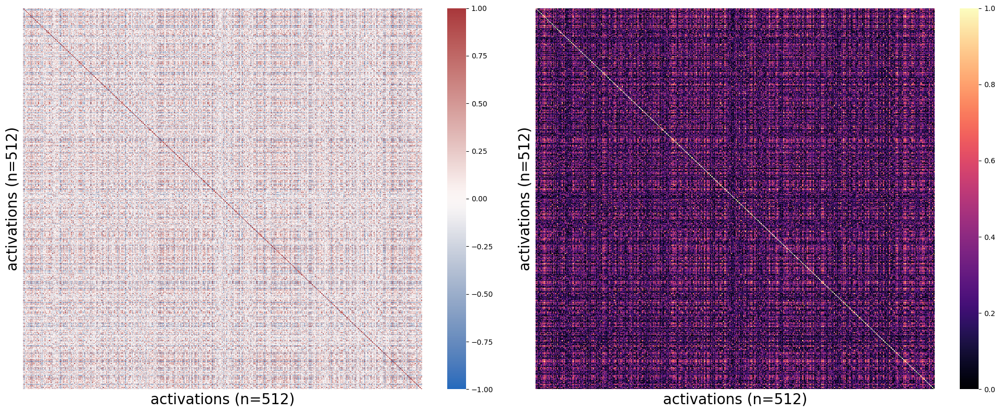

In [67]:
# Plot side by side
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.heatmap(sim,
            vmin=-1,
            vmax=1,
            cmap='vlag',
            ax=axes[0],
            xticklabels=False,
            yticklabels=False)
axes[0].set_xlabel("activations (n=512)", fontsize=20)
axes[0].set_ylabel("activations (n=512)", fontsize=20)

sns.heatmap(abs(sim),
            vmin=0,
            vmax=1,
            cmap='magma',
            ax=axes[1],
            xticklabels=False,
            yticklabels=False)
axes[1].set_xlabel("activations (n=512)", fontsize=20)
axes[1].set_ylabel("activations (n=512)", fontsize=20)

plt.tight_layout()
plt.show()

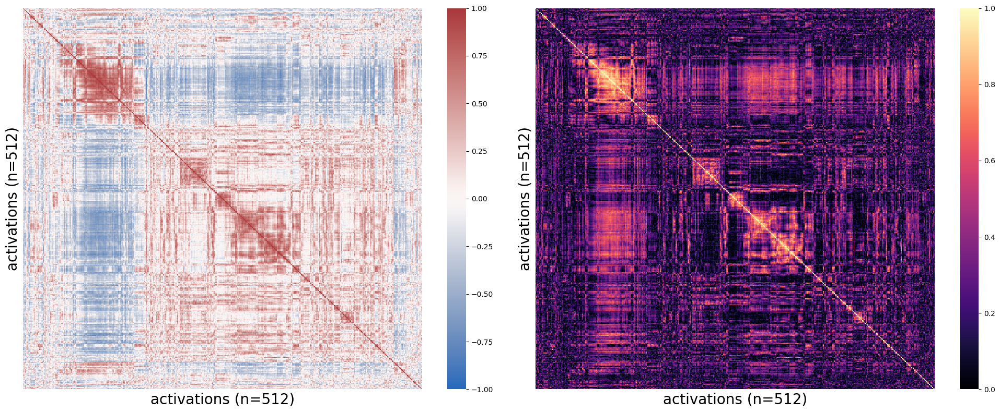

In [ ]:
# Plot side by side
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.heatmap(sim_clustered,
            vmin=-1,
            vmax=1,
            cmap='vlag',
            ax=axes[0],
            xticklabels=False,
            yticklabels=False)
axes[0].set_xlabel("activations (n=512)", fontsize=20)
axes[0].set_ylabel("activations (n=512)", fontsize=20)

sns.heatmap(abs(sim_clustered),
            vmin=0,
            vmax=1,
            cmap='magma',
            ax=axes[1],
            xticklabels=False,
            yticklabels=False)
axes[1].set_xlabel("activations (n=512)", fontsize=20)
axes[1].set_ylabel("activations (n=512)", fontsize=20)

plt.tight_layout()
plt.show()

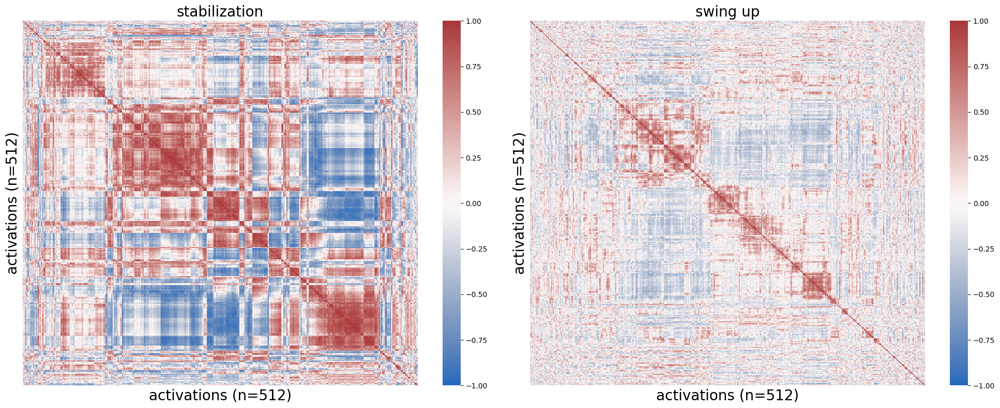

In [70]:
# Plot side by side
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.heatmap(sim_clustered_stabilization,
            vmin=-1,
            vmax=1,
            cmap='vlag',
            ax=axes[0],
            xticklabels=False,
            yticklabels=False)
axes[0].set_title("stabilization", fontsize=20)
axes[0].set_xlabel("activations (n=512)", fontsize=20)
axes[0].set_ylabel("activations (n=512)", fontsize=20)

sns.heatmap(sim_clustered_swingup,
            vmin=-1,
            vmax=1,
            cmap='vlag',
            ax=axes[1],
            xticklabels=False,
            yticklabels=False)
axes[1].set_title("swing up", fontsize=20)
axes[1].set_xlabel("activations (n=512)", fontsize=20)
axes[1].set_ylabel("activations (n=512)", fontsize=20)

plt.tight_layout()
plt.show()

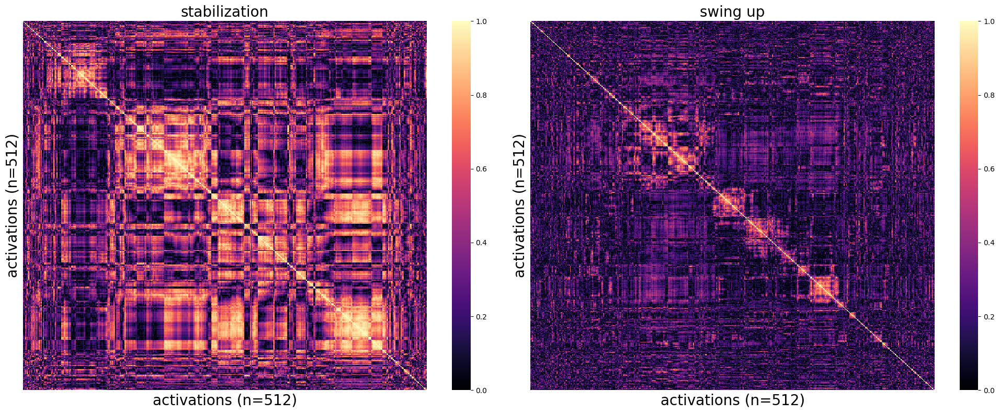

In [69]:
# Plot side by side
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.heatmap(abs(sim_clustered_stabilization),
            vmin=0,
            vmax=1,
            cmap='magma',
            ax=axes[0],
            xticklabels=False,
            yticklabels=False)
axes[0].set_title("stabilization", fontsize=20)
axes[0].set_xlabel("activations (n=512)", fontsize=20)
axes[0].set_ylabel("activations (n=512)", fontsize=20)

sns.heatmap(abs(sim_clustered_swingup),
            vmin=0,
            vmax=1,
            cmap='magma',
            ax=axes[1],
            xticklabels=False,
            yticklabels=False)
axes[1].set_title("swing up", fontsize=20)
axes[1].set_xlabel("activations (n=512)", fontsize=20)
axes[1].set_ylabel("activations (n=512)", fontsize=20)

plt.tight_layout()
plt.show()

# Activation stats

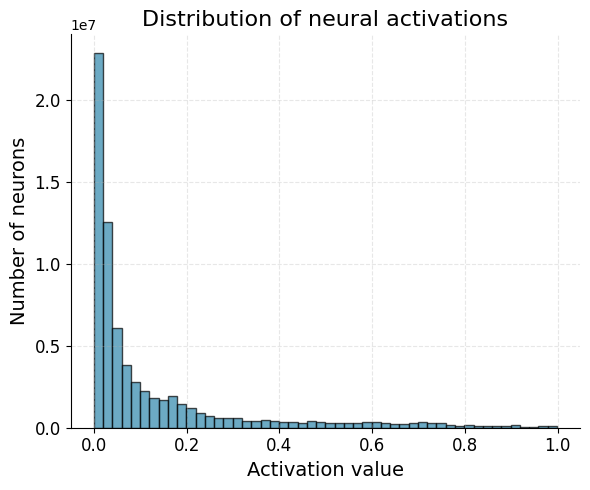

In [30]:
plt.figure(figsize=(6, 5))
plt.hist(z.flatten(),
         bins=50,
         density=False,
         alpha=0.7,
         color='#2E86AB',
         edgecolor='black')
plt.xlabel('Activation value', fontsize=14)
plt.ylabel('Number of neurons', fontsize=14)
plt.title('Distribution of neural activations', fontsize=16)
plt.tick_params(labelsize=12)
#plt.ylim(0, 1)
plt.grid(alpha=0.3, linestyle='--')
plt.tight_layout()
sns.despine()
plt.show()

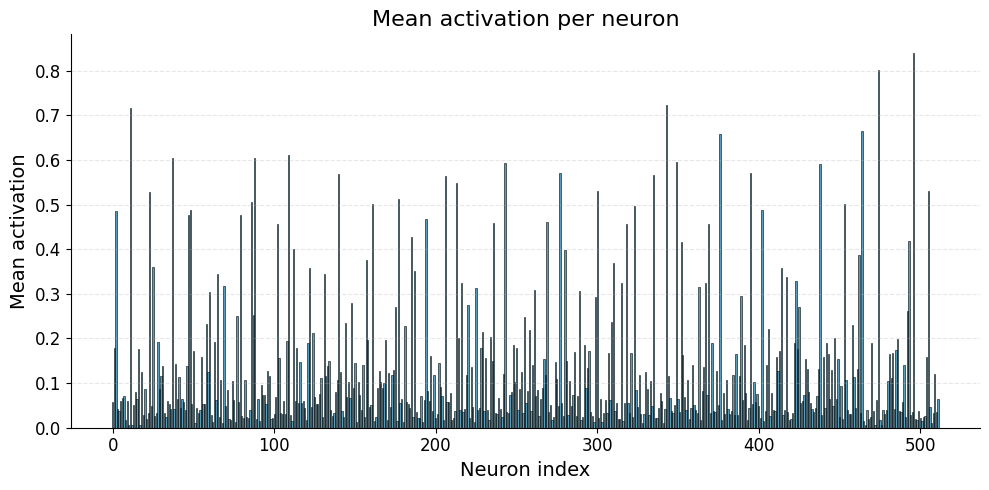

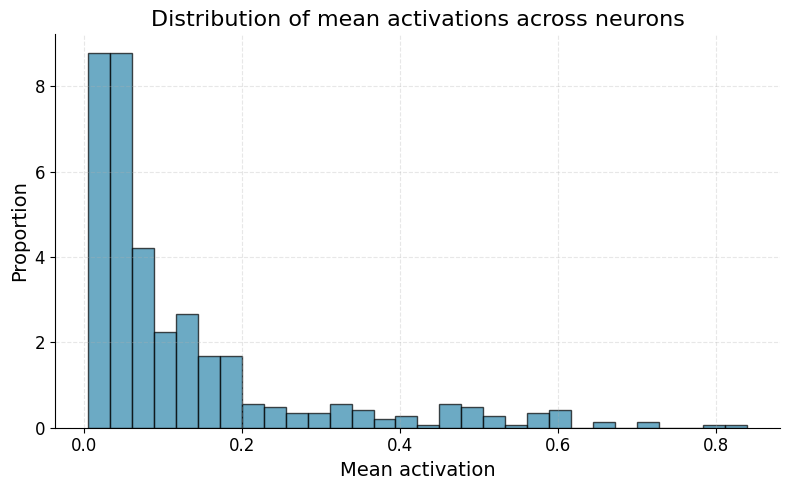

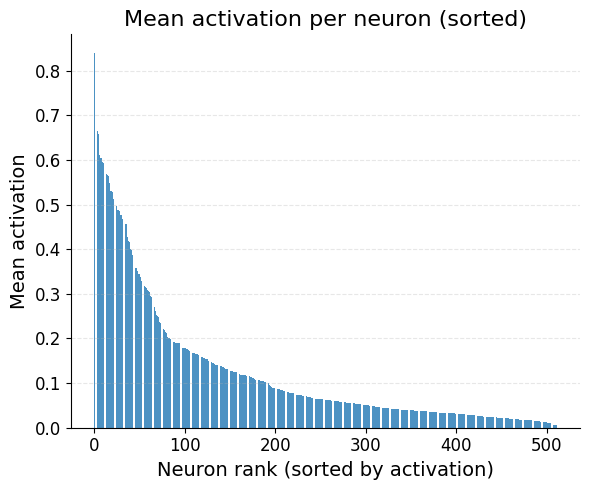

In [33]:
mean_rates = z.mean(axis=0)  # (D,)

# Bar plot of mean rates per neuron
plt.figure(figsize=(10, 5))
plt.bar(np.arange(z.shape[1]),
        mean_rates,
        color='#2E86AB',
        edgecolor='black',
        linewidth=0.5,
        alpha=0.8)
plt.xlabel('Neuron index', fontsize=14)
plt.ylabel('Mean activation', fontsize=14)
plt.title('Mean activation per neuron', fontsize=16)
plt.tick_params(labelsize=12)
plt.grid(alpha=0.3, linestyle='--', axis='y')
plt.tight_layout()
sns.despine()
plt.show()

# Histogram of mean rates
plt.figure(figsize=(8, 5))
plt.hist(mean_rates,
         bins=30,
         density=True,
         alpha=0.7,
         color='#2E86AB',
         edgecolor='black')
plt.xlabel('Mean activation', fontsize=14)
plt.ylabel('Proportion', fontsize=14)
plt.title('Distribution of mean activations across neurons', fontsize=16)
plt.tick_params(labelsize=12)
plt.grid(alpha=0.3, linestyle='--')
plt.tight_layout()
sns.despine()
plt.show()

# Sorted bar plot
sorted_mean_rates = np.sort(mean_rates)[::-1]
plt.figure(figsize=(6, 5))
plt.bar(
    np.arange(z.shape[1]),
    sorted_mean_rates,
    #color='#A23B72',
    #edgecolor='black',
    linewidth=0.5,
    alpha=0.8)
plt.xlabel('Neuron rank (sorted by activation)', fontsize=14)
plt.ylabel('Mean activation', fontsize=14)
plt.title('Mean activation per neuron (sorted)', fontsize=16)
plt.tick_params(labelsize=12)
plt.grid(alpha=0.3, linestyle='--', axis='y')
plt.tight_layout()
sns.despine()
plt.show()

In [ ]:
mean_rates = z.mean(axis=0)  # (D,)

plt.figure(figsize=(8, 4))
plt.bar(np.arange(z.shape[1]), mean_rates)
plt.xlabel('Neuron')
plt.ylabel('Mean firing rate (Hz)')
plt.title('Mean firing rate per neuron')
plt.tight_layout()
plt.show()

# Histogram of mean rates
plt.figure(figsize=(5, 4))
plt.hist(mean_rates, bins=20)
plt.xlabel('Mean firing rate (Hz)')
plt.ylabel('# Neurons')
plt.title('Distribution of mean firing rates')
plt.tight_layout()
plt.show()

sorted_mean_rates = np.sort(mean_rates)[::-1]
plt.figure(figsize=(8, 4))
plt.bar(np.arange(z.shape[1]), sorted_mean_rates)
plt.xlabel('Neuron (sorted by firing rate)')
plt.ylabel('Mean firing rate (Hz)')
plt.title('Mean firing rate per neuron (sorted)')
plt.tight_layout()
plt.show()

## Population PSTH-like trace (mean over neurons)

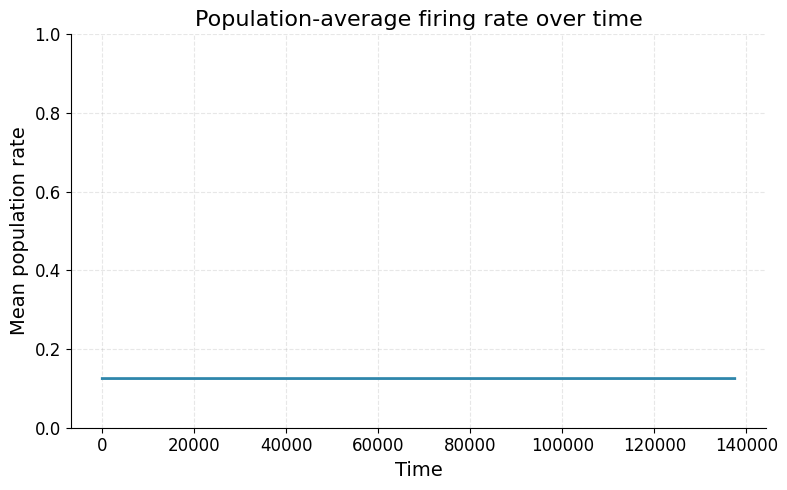

In [21]:
pop_mean = z.mean(axis=1)  # (N,)
t = np.arange(z.shape[0])
plt.figure(figsize=(8, 5))
plt.plot(t, pop_mean, linewidth=2, color='#2E86AB')
plt.xlabel('Time', fontsize=14)
plt.ylabel('Mean population rate', fontsize=14)
plt.title('Population-average firing rate over time', fontsize=16)
plt.tick_params(labelsize=12)
plt.ylim(0, 1)
plt.grid(alpha=0.3, linestyle='--')
plt.tight_layout()
sns.despine()
plt.show()

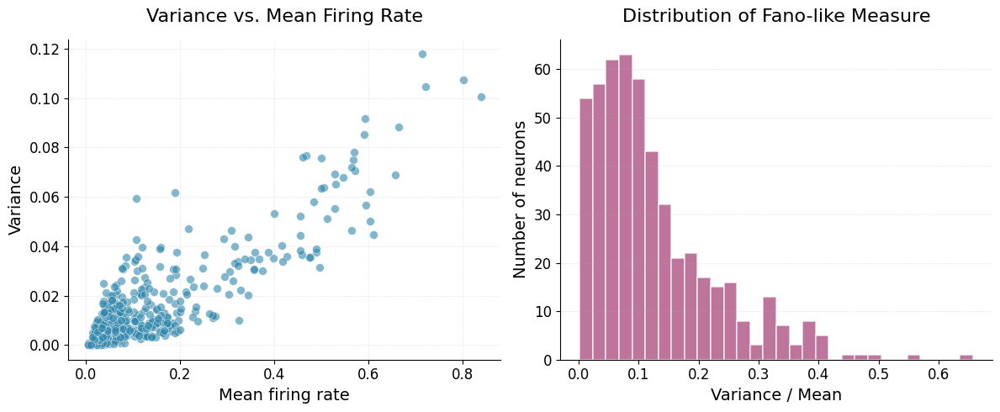

In [34]:
mean_rates = z.mean(axis=0)  # (D,)
var_rates = z.var(axis=0)  # (D,)
fano_like = var_rates / (mean_rates + 1e-9)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Left panel: Variance vs Mean scatter plot
ax1 = axes[0]
ax1.scatter(mean_rates,
            var_rates,
            alpha=0.6,
            s=50,
            color='#2E86AB',
            edgecolors='white',
            linewidth=0.5)
ax1.set_xlabel('Mean firing rate', fontsize=14)
ax1.set_ylabel('Variance', fontsize=14)
ax1.set_title('Variance vs. Mean Firing Rate', fontsize=16, pad=15)
ax1.tick_params(labelsize=12)
ax1.grid(alpha=0.3, linestyle='--', linewidth=0.5)
sns.despine(ax=ax1)

# Right panel: Fano-like measure histogram
ax2 = axes[1]
ax2.hist(fano_like,
         bins=30,
         color='#A23B72',
         alpha=0.7,
         edgecolor='white',
         linewidth=1.2)
ax2.set_xlabel('Variance / Mean', fontsize=14)
ax2.set_ylabel('Number of neurons', fontsize=14)
ax2.set_title('Distribution of Fano-like Measure', fontsize=16, pad=15)
ax2.tick_params(labelsize=12)
ax2.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.5)
sns.despine(ax=ax2)

plt.tight_layout()
plt.show()

### pca analysis

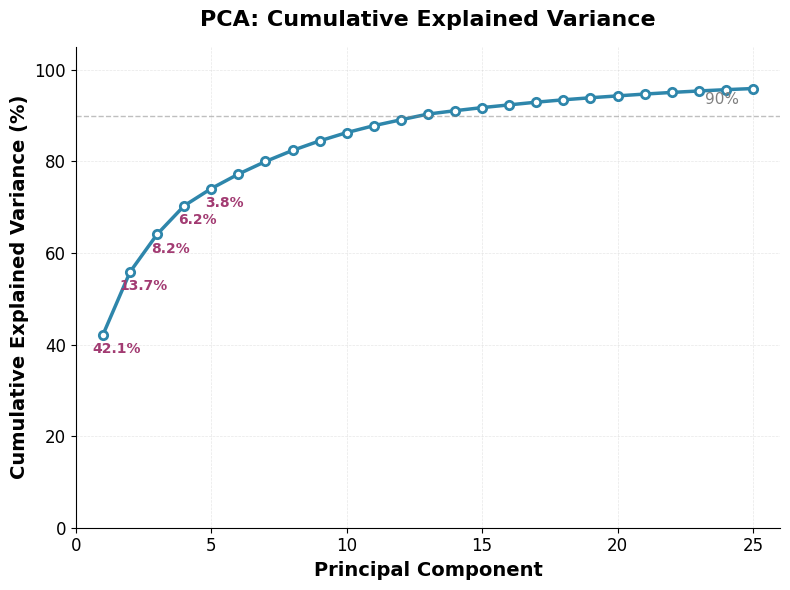

In [74]:
from sklearn.decomposition import PCA

# Perform PCA on the neural data
pca = PCA(n_components=25)
z_pca = pca.fit_transform(z,)

# Get explained variance ratios
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Create figure
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Plot cumulative explained variance
n_components = len(cumulative_variance)
ax.plot(range(1, n_components + 1),
        cumulative_variance * 100,
        'o-',
        color='#2E86AB',
        linewidth=2.5,
        markersize=6,
        markerfacecolor='white',
        markeredgewidth=2,
        markeredgecolor='#2E86AB')

# Add horizontal lines at key thresholds
for threshold in [90]:
    ax.axhline(y=threshold,
               color='gray',
               linestyle='--',
               alpha=0.5,
               linewidth=1)
    # Find component that crosses threshold
    idx = np.where(cumulative_variance * 100 >= threshold)[0]
    if len(idx) > 0:
        idx = idx[0]
        ax.text(n_components * 0.98,
                threshold + 2.5,
                f'{threshold}%',
                fontsize=11,
                ha='right',
                color='gray')
# Annotate first few components with their individual explained variance
for i in range(min(5, n_components)):
    ax.text(i + 1.5,
            cumulative_variance[i] * 100 - 4,
            f'{explained_variance[i] * 100:.1f}%',
            fontsize=10,
            ha='center',
            color='#A23B72',
            fontweight='bold')

ax.set_xlabel('Principal Component', fontsize=14, fontweight='bold')
ax.set_ylabel('Cumulative Explained Variance (%)',
              fontsize=14,
              fontweight='bold')
ax.set_title('PCA: Cumulative Explained Variance',
             fontsize=16,
             fontweight='bold',
             pad=15)
ax.set_xlim(0, n_components + 1)
ax.set_ylim(0, 105)
ax.tick_params(labelsize=12)
ax.grid(alpha=0.3, linestyle='--', linewidth=0.5)
sns.despine(ax=ax)

plt.tight_layout()
plt.show()


## Separating by behavioral motifs

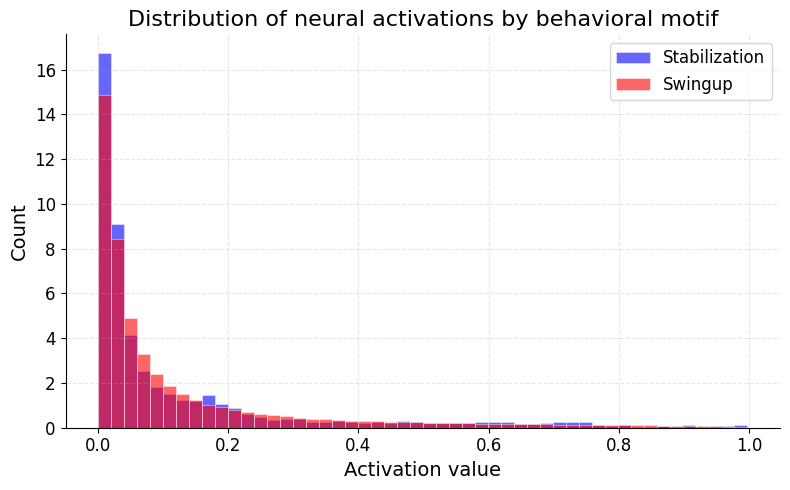

In [37]:
plt.figure(figsize=(8, 5))

# Plot histograms for both motifs
plt.hist(z_stabilization.flatten(),
         bins=50,
         density=True,
         alpha=0.6,
         color='blue',
         edgecolor='white',
         label='Stabilization',
         linewidth=0.5)
plt.hist(z_swingup.flatten(),
         bins=50,
         density=True,
         alpha=0.6,
         color='red',
         edgecolor='white',
         label='Swingup',
         linewidth=0.5)

plt.xlabel('Activation value', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Distribution of neural activations by behavioral motif', fontsize=16)
plt.tick_params(labelsize=12)
plt.legend(fontsize=12)
plt.grid(alpha=0.3, linestyle='--')
plt.tight_layout()
sns.despine()
plt.show()

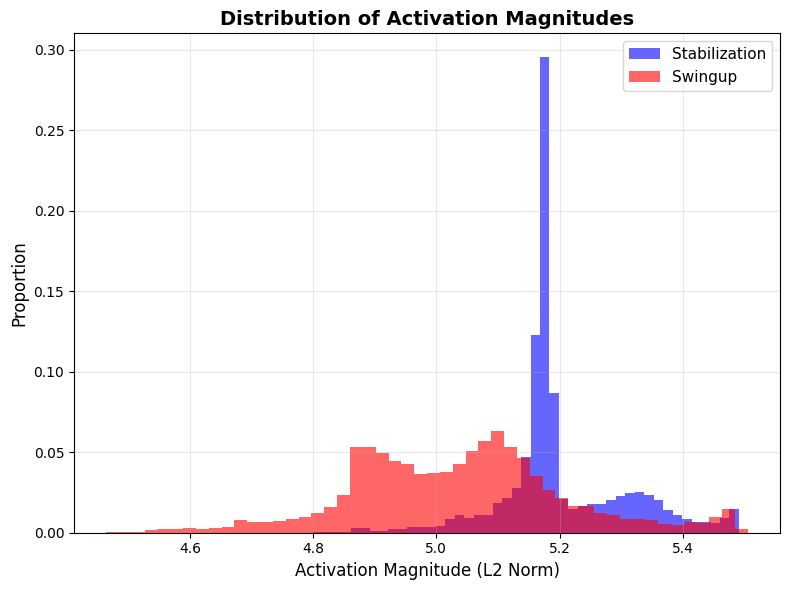

In [50]:
# Plot magnitude distributions
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Calculate magnitudes (L2 norm across features)
magnitude_stabilization = np.linalg.norm(z_stabilization, axis=1)
magnitude_swingup = np.linalg.norm(z_swingup, axis=1)
magnitude_z = np.linalg.norm(z, axis=1)

# Plot histograms with weights to sum to 1
weights_stabilization = np.ones_like(magnitude_stabilization) / len(
    magnitude_stabilization)
weights_swingup = np.ones_like(magnitude_swingup) / len(magnitude_swingup)
weights_z = np.ones_like(magnitude_z) / len(magnitude_z)

ax.hist(magnitude_stabilization,
        bins=50,
        alpha=0.6,
        label='Stabilization',
        color='blue',
        weights=weights_stabilization)
ax.hist(magnitude_swingup,
        bins=50,
        alpha=0.6,
        label='Swingup',
        color='red',
        weights=weights_swingup)
# ax.hist(magnitude_z,
#         bins=50,
#         alpha=0.6,
#         label='All',
#         color='green',
#         weights=weights_z)

ax.set_xlabel('Activation Magnitude (L2 Norm)', fontsize=12)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_title('Distribution of Activation Magnitudes',
             fontsize=14,
             fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

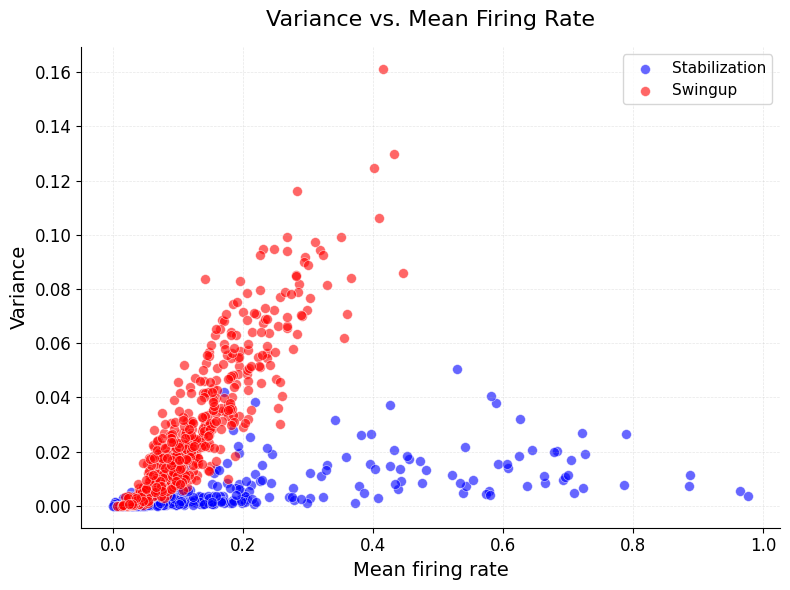

In [48]:
# Calculate statistics for stabilization
mean_rates_stabilization = z_stabilization.mean(axis=0)  # (D,)
var_rates_stabilization = z_stabilization.var(axis=0)  # (D,)
fano_like_stabilization = var_rates_stabilization / (mean_rates_stabilization +
                                                     1e-9)

# Calculate statistics for swingup
mean_rates_swingup = z_swingup.mean(axis=0)  # (D,)
var_rates_swingup = z_swingup.var(axis=0)  # (D,)
fano_like_swingup = var_rates_swingup / (mean_rates_swingup + 1e-9)

# Create a figure with one subplot
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Variance vs Mean scatter plot
ax.scatter(mean_rates_stabilization,
           var_rates_stabilization,
           alpha=0.6,
           s=50,
           color='blue',
           edgecolors='white',
           linewidth=0.5,
           label='Stabilization')
ax.scatter(mean_rates_swingup,
           var_rates_swingup,
           alpha=0.6,
           s=50,
           color='red',
           edgecolors='white',
           linewidth=0.5,
           label='Swingup')
ax.set_xlabel('Mean firing rate', fontsize=14)
ax.set_ylabel('Variance', fontsize=14)
ax.set_title('Variance vs. Mean Firing Rate', fontsize=16, pad=15)
ax.tick_params(labelsize=12)
ax.grid(alpha=0.3, linestyle='--', linewidth=0.5)
ax.legend(fontsize=11)
sns.despine(ax=ax)

plt.tight_layout()
plt.show()

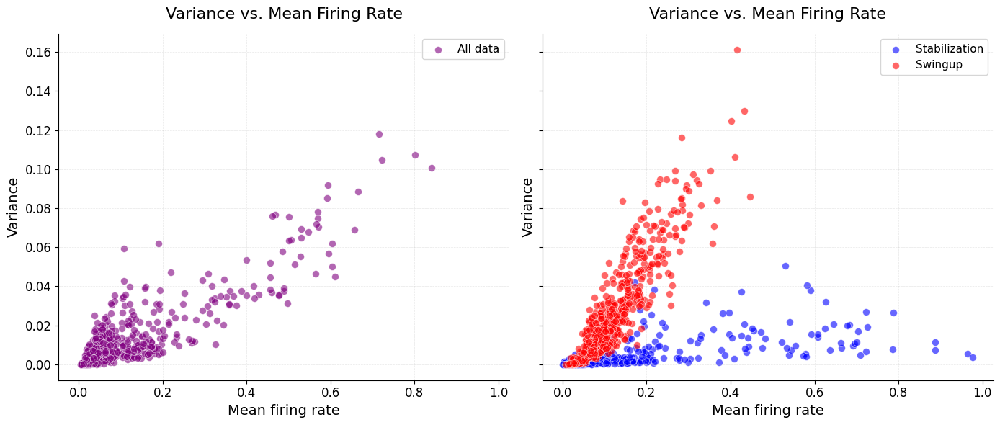

In [58]:
# Calculate statistics for all data (z)
mean_rates_all = z.mean(axis=0)  # (D,)
var_rates_all = z.var(axis=0)  # (D,)

# Calculate statistics for stabilization
mean_rates_stabilization = z_stabilization.mean(axis=0)  # (D,)
var_rates_stabilization = z_stabilization.var(axis=0)  # (D,)
fano_like_stabilization = var_rates_stabilization / (mean_rates_stabilization +
                                                     1e-9)

# Calculate statistics for swingup
mean_rates_swingup = z_swingup.mean(axis=0)  # (D,)
var_rates_swingup = z_swingup.var(axis=0)  # (D,)
fano_like_swingup = var_rates_swingup / (mean_rates_swingup + 1e-9)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Left plot: All data (z)
ax1.scatter(mean_rates_all,
            var_rates_all,
            alpha=0.6,
            s=50,
            color='purple',
            edgecolors='white',
            linewidth=0.5,
            label='All data')
ax1.set_xlabel('Mean firing rate', fontsize=14)
ax1.set_ylabel('Variance', fontsize=14)
ax1.set_title('Variance vs. Mean Firing Rate', fontsize=16, pad=15)
ax1.tick_params(labelsize=12)
ax1.grid(alpha=0.3, linestyle='--', linewidth=0.5)
ax1.legend(fontsize=11)
sns.despine(ax=ax1)

# Right plot: Stabilization vs Swingup
ax2.scatter(mean_rates_stabilization,
            var_rates_stabilization,
            alpha=0.6,
            s=50,
            color='blue',
            edgecolors='white',
            linewidth=0.5,
            label='Stabilization')
ax2.scatter(mean_rates_swingup,
            var_rates_swingup,
            alpha=0.6,
            s=50,
            color='red',
            edgecolors='white',
            linewidth=0.5,
            label='Swingup')
ax2.set_xlabel('Mean firing rate', fontsize=14)
ax2.set_ylabel('Variance', fontsize=14)
ax2.set_title('Variance vs. Mean Firing Rate', fontsize=16, pad=15)
ax2.tick_params(labelsize=12)
ax2.grid(alpha=0.3, linestyle='--', linewidth=0.5)
ax2.legend(fontsize=11)
sns.despine(ax=ax2)

plt.tight_layout()
plt.show()

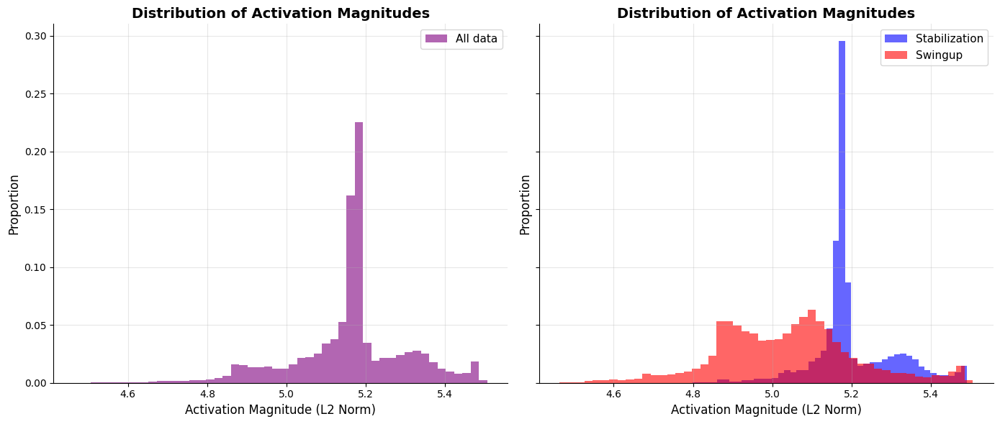

In [61]:
# Plot magnitude distributions
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Calculate magnitudes (L2 norm across features)
magnitude_stabilization = np.linalg.norm(z_stabilization, axis=1)
magnitude_swingup = np.linalg.norm(z_swingup, axis=1)
magnitude_z = np.linalg.norm(z, axis=1)

# Plot histograms with weights to sum to 1
weights_stabilization = np.ones_like(magnitude_stabilization) / len(
    magnitude_stabilization)
weights_swingup = np.ones_like(magnitude_swingup) / len(magnitude_swingup)
weights_z = np.ones_like(magnitude_z) / len(magnitude_z)

# Left plot: All data (z)
ax1.hist(magnitude_z,
         bins=50,
         alpha=0.6,
         label='All data',
         color='purple',
         weights=weights_z)
ax1.set_xlabel('Activation Magnitude (L2 Norm)', fontsize=12)
ax1.set_ylabel('Proportion', fontsize=12)
ax1.set_title('Distribution of Activation Magnitudes',
              fontsize=14,
              fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.3)

# Right plot: Stabilization vs Swingup
ax2.hist(magnitude_stabilization,
         bins=50,
         alpha=0.6,
         label='Stabilization',
         color='blue',
         weights=weights_stabilization)
ax2.hist(magnitude_swingup,
         bins=50,
         alpha=0.6,
         label='Swingup',
         color='red',
         weights=weights_swingup)
ax2.set_xlabel('Activation Magnitude (L2 Norm)', fontsize=12)
ax2.set_ylabel('Proportion', fontsize=12)
ax2.set_title('Distribution of Activation Magnitudes',
              fontsize=14,
              fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)
sns.despine()

plt.tight_layout()
plt.show()

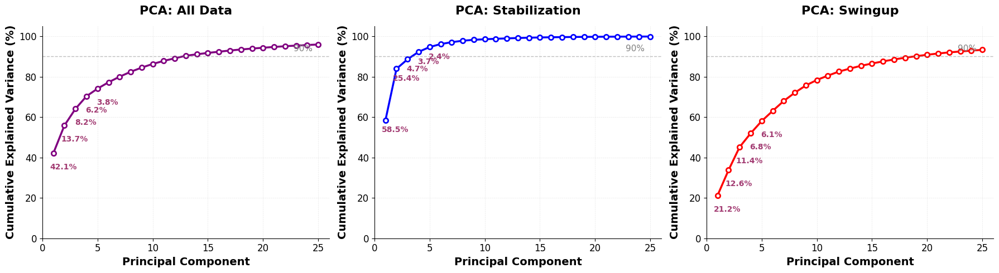

In [81]:
from sklearn.decomposition import PCA

# Perform PCA on the neural data for all three datasets
pca_z = PCA(n_components=25)
z_pca = pca_z.fit_transform(z)

pca_stabilization = PCA(n_components=25)
z_stabilization_pca = pca_stabilization.fit_transform(z_stabilization)

pca_swingup = PCA(n_components=25)
z_swingup_pca = pca_swingup.fit_transform(z_swingup)

# Get explained variance ratios for all three
explained_variance_z = pca_z.explained_variance_ratio_
cumulative_variance_z = np.cumsum(explained_variance_z)

explained_variance_stabilization = pca_stabilization.explained_variance_ratio_
cumulative_variance_stabilization = np.cumsum(explained_variance_stabilization)

explained_variance_swingup = pca_swingup.explained_variance_ratio_
cumulative_variance_swingup = np.cumsum(explained_variance_swingup)

# Create figure with three subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: All data (z)
n_components = len(cumulative_variance_z)
ax1.plot(range(1, n_components + 1),
         cumulative_variance_z * 100,
         'o-',
         color='purple',
         linewidth=2.5,
         markersize=6,
         markerfacecolor='white',
         markeredgewidth=2,
         markeredgecolor='purple')

for threshold in [90]:
    ax1.axhline(y=threshold,
                color='gray',
                linestyle='--',
                alpha=0.5,
                linewidth=1)
    idx = np.where(cumulative_variance_z * 100 >= threshold)[0]
    if len(idx) > 0:
        idx = idx[0]
        ax1.text(n_components * 0.98,
                 threshold + 2.5,
                 f'{threshold}%',
                 fontsize=11,
                 ha='right',
                 color='gray')

for i in range(min(5, n_components)):
    ax1.text(i + 1.9,
             cumulative_variance_z[i] * 100 - 8,
             f'{explained_variance_z[i] * 100:.1f}%',
             fontsize=10,
             ha='center',
             color='#A23B72',
             fontweight='bold')

ax1.set_xlabel('Principal Component', fontsize=14, fontweight='bold')
ax1.set_ylabel('Cumulative Explained Variance (%)',
               fontsize=14,
               fontweight='bold')
ax1.set_title('PCA: All Data', fontsize=16, fontweight='bold', pad=15)
ax1.set_xlim(0, n_components + 1)
ax1.set_ylim(0, 105)
ax1.tick_params(labelsize=12)
ax1.grid(alpha=0.3, linestyle='--', linewidth=0.5)

# Plot 2: Stabilization
ax2.plot(range(1, n_components + 1),
         cumulative_variance_stabilization * 100,
         'o-',
         color='blue',
         linewidth=2.5,
         markersize=6,
         markerfacecolor='white',
         markeredgewidth=2,
         markeredgecolor='blue')

for threshold in [90]:
    ax2.axhline(y=threshold,
                color='gray',
                linestyle='--',
                alpha=0.5,
                linewidth=1)
    idx = np.where(cumulative_variance_stabilization * 100 >= threshold)[0]
    if len(idx) > 0:
        idx = idx[0]
        ax2.text(n_components * 0.98,
                 threshold + 2.5,
                 f'{threshold}%',
                 fontsize=11,
                 ha='right',
                 color='gray')

for i in range(min(5, n_components)):
    ax2.text(i + 1.9,
             cumulative_variance_stabilization[i] * 100 - 6,
             f'{explained_variance_stabilization[i] * 100:.1f}%',
             fontsize=10,
             ha='center',
             color='#A23B72',
             fontweight='bold')

ax2.set_xlabel('Principal Component', fontsize=14, fontweight='bold')
ax2.set_ylabel('Cumulative Explained Variance (%)',
               fontsize=14,
               fontweight='bold')
ax2.set_title('PCA: Stabilization', fontsize=16, fontweight='bold', pad=15)
ax2.set_xlim(0, n_components + 1)
ax2.set_ylim(0, 105)
ax2.tick_params(labelsize=12)
ax2.grid(alpha=0.3, linestyle='--', linewidth=0.5)

# Plot 3: Swingup
ax3.plot(range(1, n_components + 1),
         cumulative_variance_swingup * 100,
         'o-',
         color='red',
         linewidth=2.5,
         markersize=6,
         markerfacecolor='white',
         markeredgewidth=2,
         markeredgecolor='red')

for threshold in [90]:
    ax3.axhline(y=threshold,
                color='gray',
                linestyle='--',
                alpha=0.5,
                linewidth=1)
    idx = np.where(cumulative_variance_swingup * 100 >= threshold)[0]
    if len(idx) > 0:
        idx = idx[0]
        ax3.text(n_components * 0.98,
                 threshold + 2.5,
                 f'{threshold}%',
                 fontsize=11,
                 ha='right',
                 color='gray')

for i in range(min(5, n_components)):
    ax3.text(i + 1.9,
             cumulative_variance_swingup[i] * 100 - 8,
             f'{explained_variance_swingup[i] * 100:.1f}%',
             fontsize=10,
             ha='center',
             color='#A23B72',
             fontweight='bold')

ax3.set_xlabel('Principal Component', fontsize=14, fontweight='bold')
ax3.set_ylabel('Cumulative Explained Variance (%)',
               fontsize=14,
               fontweight='bold')
ax3.set_title('PCA: Swingup', fontsize=16, fontweight='bold', pad=15)
ax3.set_xlim(0, n_components + 1)
ax3.set_ylim(0, 105)
ax3.tick_params(labelsize=12)
ax3.grid(alpha=0.3, linestyle='--', linewidth=0.5)

sns.despine()
plt.tight_layout()
plt.show()
